In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
from sklearn import preprocessing
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
from sklearn.kernel_approximation import RBFSampler

import warnings
warnings.filterwarnings("ignore")

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(device)

%config InlineBackend.figure_format = "retina"

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

cuda


In [2]:
def save_reconstructed_image(outputs, save_path):
    outputs = outputs.cpu().numpy().clip(0, 1)
    outputs = (outputs * 255).astype(np.uint8)
    pil_image = Image.fromarray(outputs)
    pil_image.save(save_path)

In [3]:
img = torchvision.io.read_image('dog.jpg')
print(img.shape)

torch.Size([3, 1365, 2048])


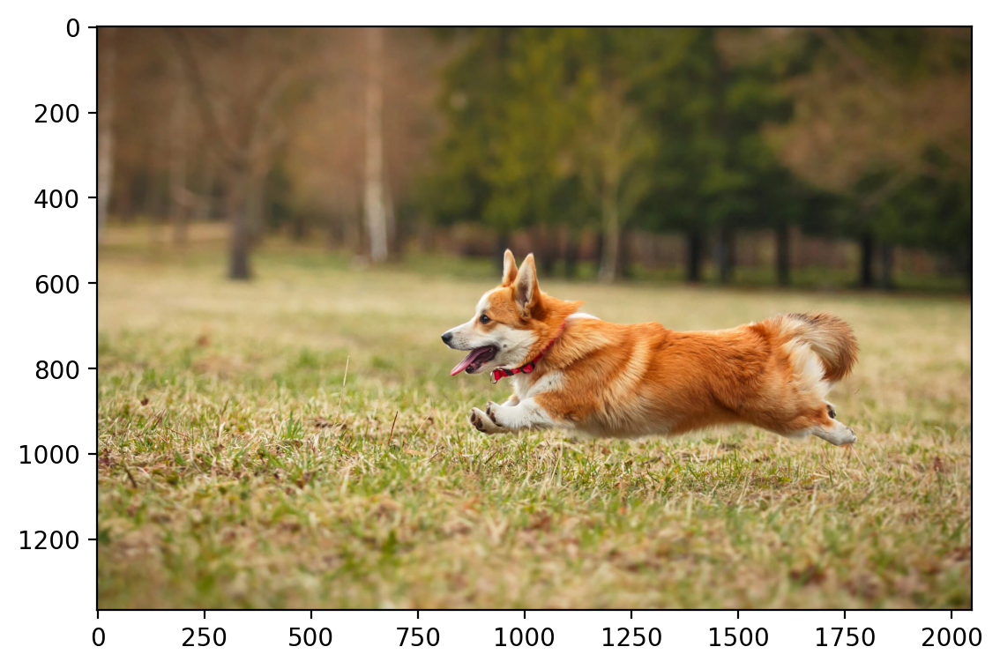

In [4]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [5]:
img_scaled = preprocessing.MinMaxScaler().fit_transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled = torch.tensor(img_scaled)
img_scaled = img_scaled.to(device)
print(img_scaled.shape)
print(img_scaled)

torch.Size([3, 1365, 2048])
tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.14

In [6]:
crop = transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop = crop.to(device)
save_reconstructed_image(rearrange(crop, 'c h w -> h w c'), "./Original.png")
print(crop.shape)

torch.Size([3, 300, 300])


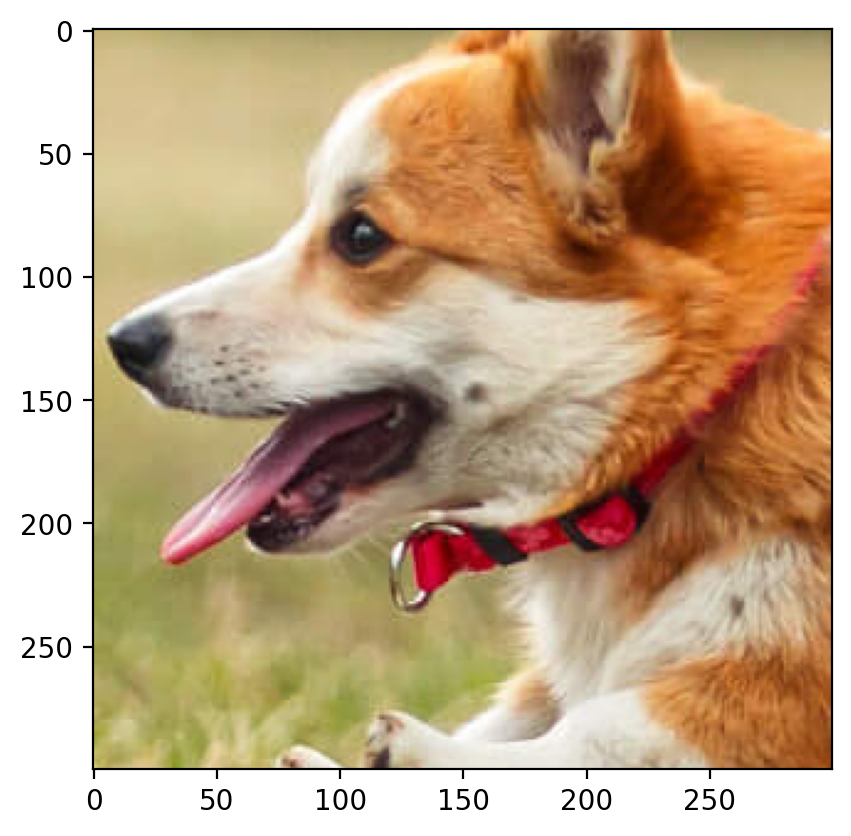

In [7]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [8]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape

    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    X = torch.stack([h_coords, w_coords], dim=1).float()

    X = X.to(device)

    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [9]:
dog_X, dog_Y = create_coordinate_map(crop)
dog_X.shape, dog_Y.shape

(torch.Size([90000, 2]), torch.Size([90000, 3]))

In [10]:
print(dog_X[:10, :], '\n', dog_Y[:10, :])

tensor([[0., 0.],
        [0., 1.],
        [0., 2.],
        [0., 3.],
        [0., 4.],
        [0., 5.],
        [0., 6.],
        [0., 7.],
        [0., 8.],
        [0., 9.]], device='cuda:0') 
 tensor([[0.7686, 0.6941, 0.4745],
        [0.7686, 0.6941, 0.4745],
        [0.7686, 0.6941, 0.4745],
        [0.7686, 0.6941, 0.4745],
        [0.7686, 0.6941, 0.4745],
        [0.7686, 0.6941, 0.4745],
        [0.7686, 0.6941, 0.4745],
        [0.7686, 0.6941, 0.4745],
        [0.7608, 0.7020, 0.4784],
        [0.7608, 0.7020, 0.4784]], device='cuda:0')


In [11]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())
dog_X_scaled = scaler_X.transform(dog_X.cpu())
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)
dog_X_scaled = dog_X_scaled.float()

In [12]:
dog_X_scaled.shape, dog_X_scaled[:10, :]

(torch.Size([90000, 2]),
 tensor([[-1.0000, -1.0000],
         [-1.0000, -0.9933],
         [-1.0000, -0.9866],
         [-1.0000, -0.9799],
         [-1.0000, -0.9732],
         [-1.0000, -0.9666],
         [-1.0000, -0.9599],
         [-1.0000, -0.9532],
         [-1.0000, -0.9465],
         [-1.0000, -0.9398]], device='cuda:0'))

In [13]:
def mask_image(crop, probability):
  A = torch.rand(crop[0].shape)
  mask = A < probability
  red, green, blue = crop[0].clone(), crop[1].clone(), crop[2].clone()
  red[mask] = float("nan")
  green[mask] = float("nan")
  blue[mask] = float("nan")
  final = torch.stack([red, green, blue], dim = 0)
  return final

### Simple Single-Layered Fully Connected Linear Neural Network

In [14]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)

In [15]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, features)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)


        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

#### $$ \text{PSNR} = 20 \log_{10}(\frac{\text{MAX}_I}{\sqrt{\text{MSE}}})$$

In [16]:
def metrics(img1, img2, max_value = 1.0):
    rmse = torch.sqrt(F.mse_loss(img1, img2))
    psnr_value = 20 * torch.log10(max_value / rmse)
    return rmse, psnr_value.item()

In [17]:
def predict_plot(original_img, net, X, removed_img, p, idx, giveMetrics = False, allowSave = False, fileName1 = None, fileName2 = None):
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)

    rmse, psnr = metrics(original_img, rearrange(outputs, "h w c -> c h w"))

    fig, ax = plt.subplots(nrows = 1, ncols = 3, gridspec_kw = {"width_ratios": [1, 1, 1]}, figsize = (13, 6))
    fig.suptitle(f"{idx + 1}" "\n" "Reconstruction using RFF" "\n" f"RMSE : {rmse} | PSNR : {psnr} | Removed : {p}%", fontsize = 10)
    ax[0].imshow(rearrange(original_img, 'c h w -> h w c').cpu().numpy())
    ax[0].set_title(fr"Ground Truth Image $({height} \times {width})$")
    ax[0].axis("off")
    ax[1].imshow(rearrange(removed_img, 'c h w -> h w c').cpu().numpy())
    ax[1].set_title(fr"Removed: {p}%")
    ax[1].axis("off")
    ax[2].imshow(outputs.cpu().detach().numpy())
    ax[2].set_title(fr"Reconstructed Image $({height} \times {width})$")
    ax[2].axis("off")

    if allowSave and fileName1 and fileName2:
      save_reconstructed_image(outputs, fileName1)
      save_reconstructed_image(rearrange(removed_img, 'c h w -> h w c'), fileName2)

    plt.show()

    if giveMetrics:
      return rmse, psnr

### Adding Random Fourier Features to Single-Layered Fully Connected Neural Network

In [18]:
def create_rff_features(X, num_features, sigma):
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2), random_state = 42)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [19]:
probs = list(np.arange(0.1, 1, 0.1))

In [20]:
X_rff = create_rff_features(dog_X_scaled, 15000, 0.008)

In [21]:
X_rff.shape

torch.Size([90000, 15000])

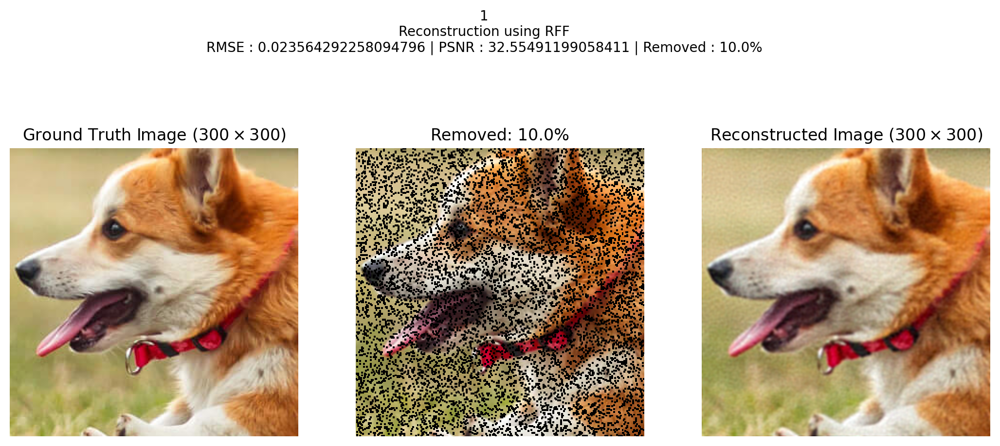

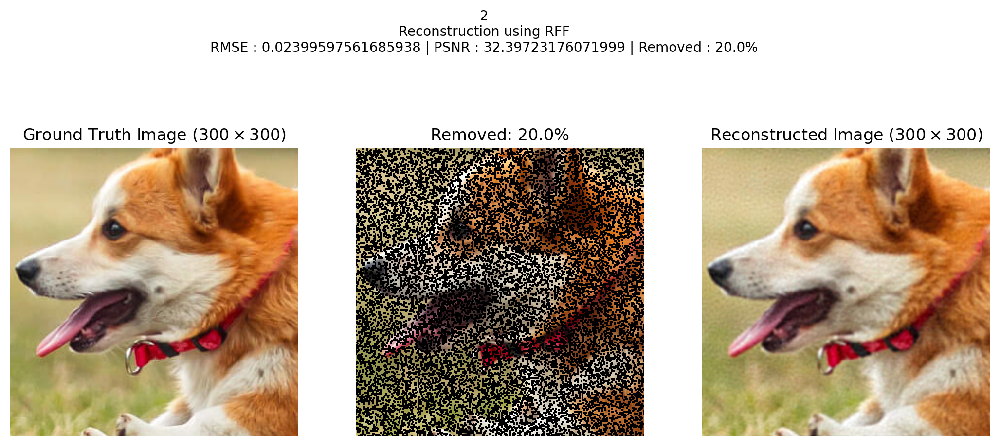

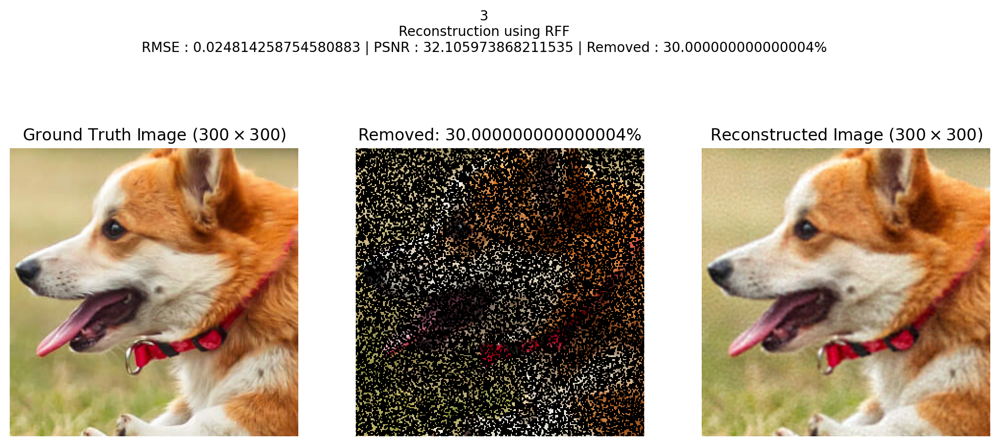

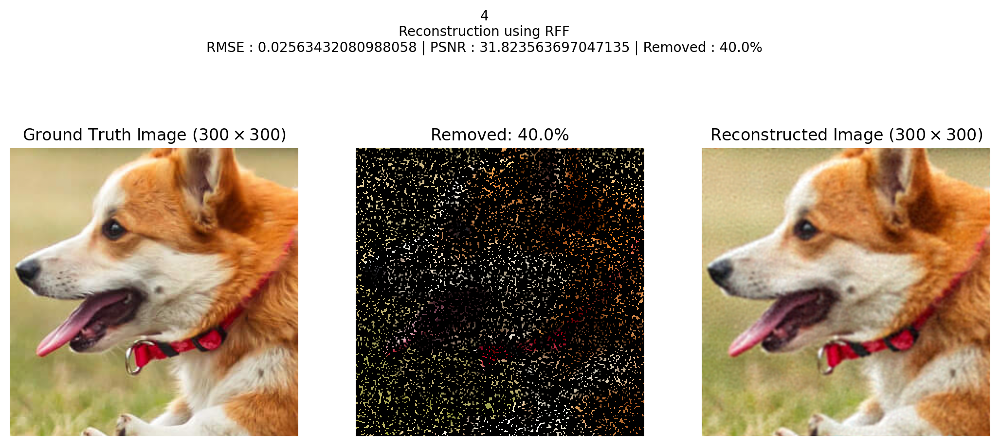

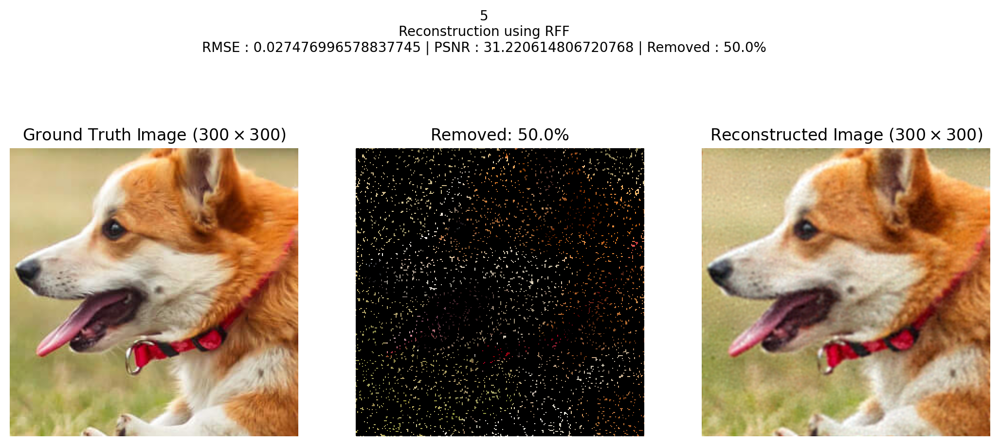

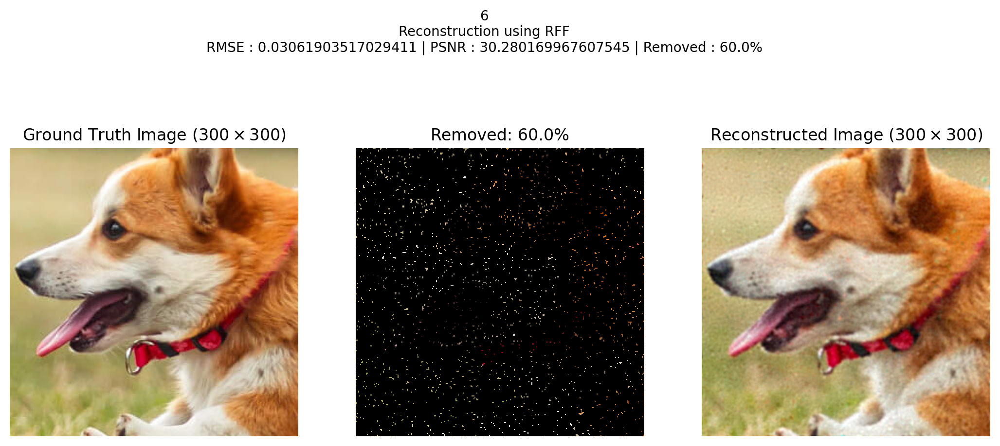

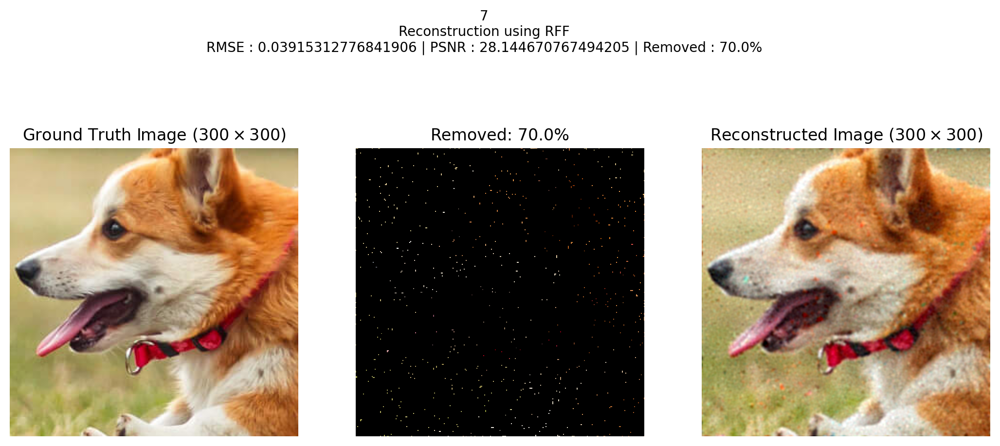

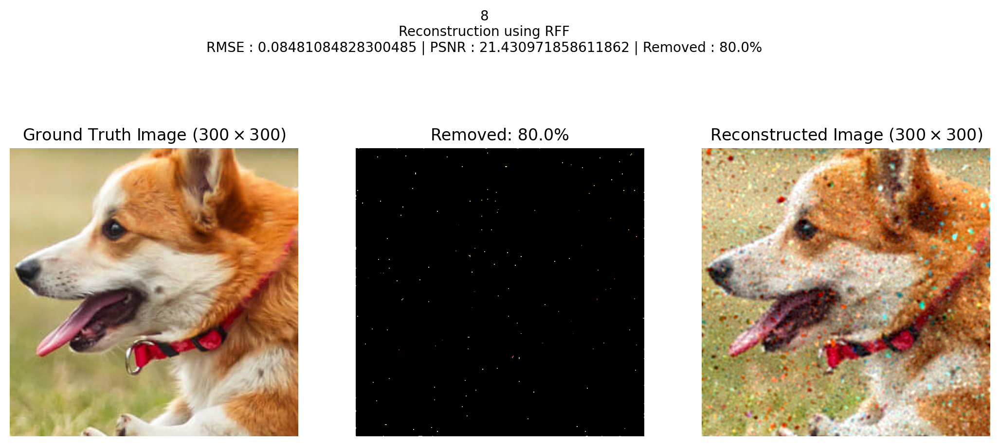

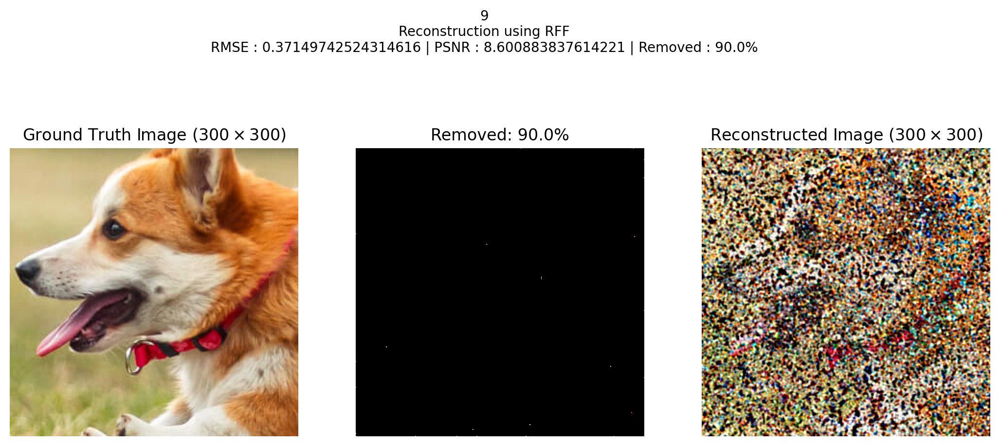

In [22]:
rmses, psnrs = [], []
for i, p in enumerate(probs):
  net = LinearModel(15000, 3)
  net.to(device)
  left_image = mask_image(crop, p)
  mask = rearrange(~torch.isnan(left_image)[0], "h w -> (h w)").to(device)
  train(net, 0.01, X_rff[mask], dog_Y[mask], 2000, verbose = False)
  rmse, psnr = predict_plot(crop, net, X_rff, left_image, p * 100, i, giveMetrics = True, allowSave = True, fileName1 = f"./Reconstruct{i + 1}.png", fileName2 = f"./Empty{i + 1}.png")
  del net
  del mask
  torch.cuda.empty_cache()
  rmses.append(rmse)
  psnrs.append(psnr)

In [23]:
import gc
del X_rff
torch.cuda.empty_cache()
gc.collect()

34767

In [24]:
rm = [x.detach().cpu().numpy() for x in rmses]

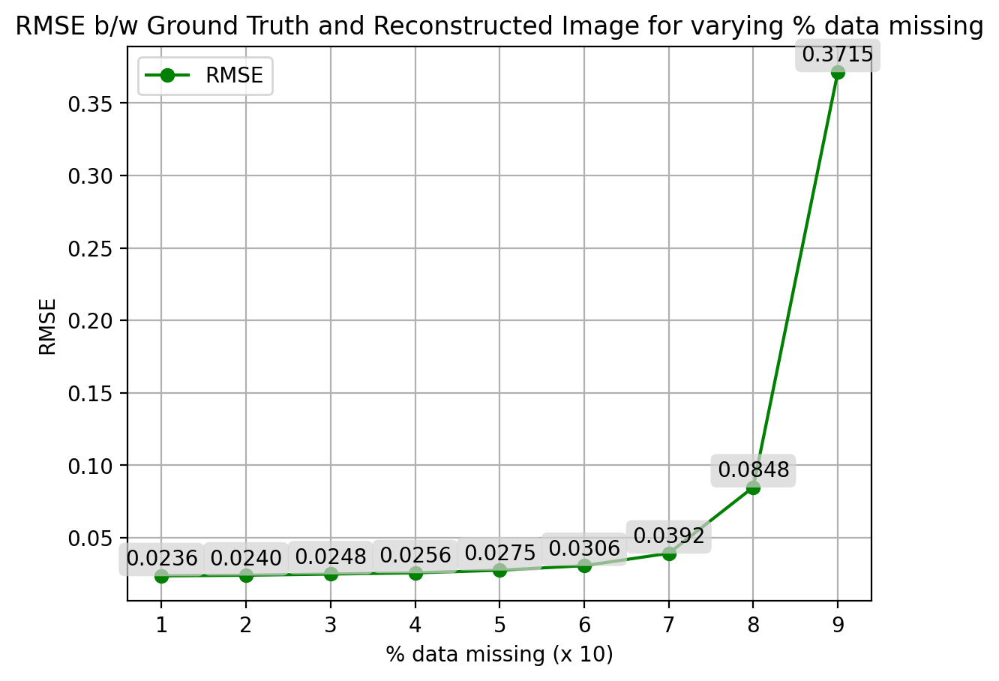

In [25]:
plt.plot(range(1, 10, 1), rm, marker = "o", label = "RMSE", color = "green")
plt.xlabel(r"% data missing (x 10)")
plt.ylabel("RMSE")
plt.title("RMSE b/w Ground Truth and Reconstructed Image for varying % data missing")
plt.grid()
plt.legend()
for i, psnr in enumerate(rm):
    plt.annotate(f'{psnr:.4f}', (range(1, 10, 1)[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()

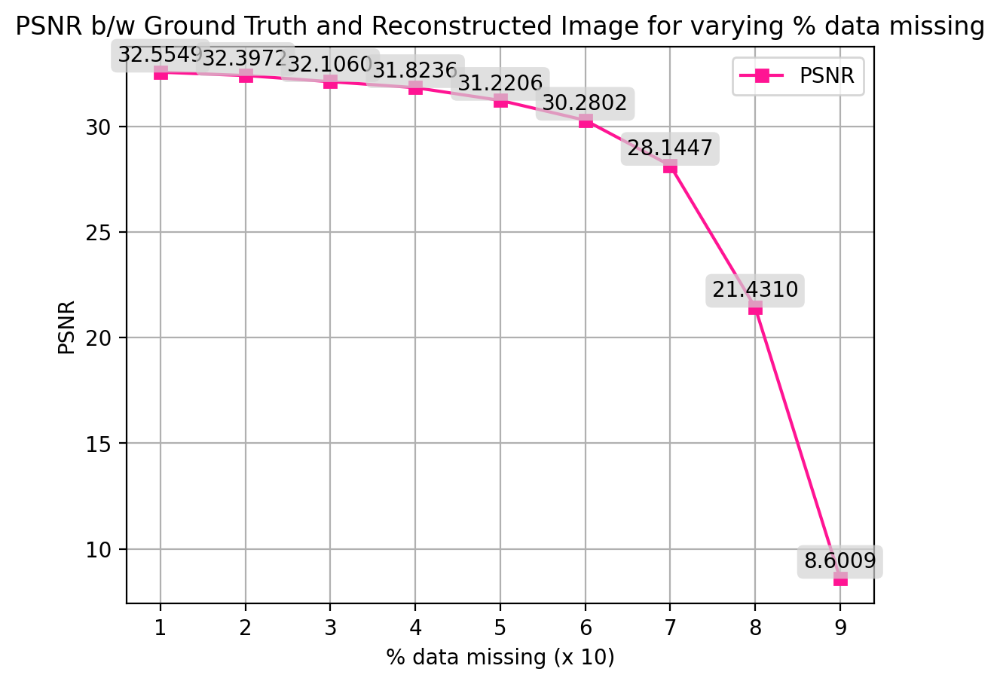

In [26]:
plt.plot(range(1, 10, 1), psnrs, marker = "s", label = "PSNR", color = "deeppink")
plt.xlabel(r"% data missing (x 10)")
plt.ylabel("PSNR")
plt.title("PSNR b/w Ground Truth and Reconstructed Image for varying % data missing")
plt.grid()
plt.legend()
for i, psnr in enumerate(psnrs):
    plt.annotate(f'{psnr:.4f}', (range(1, 10, 1)[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()